In [1]:
import lightgbm as lgb
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msno
import datetime
import seaborn as sns
plt.rcParams['font.sans-serif']=['SimHei']
plt.rcParams['axes.unicode_minus'] = False
import gc
from collections import Counter
import re
from sklearn import preprocessing

In [2]:
train = pd.read_csv('train.csv')
test1 = pd.read_csv('test1.csv')
# labels = train['label']
df_train = train.drop(['Unnamed: 0'], axis=1)
df_test = test1.drop(['Unnamed: 0'], axis=1)
for col in ["android_id","apptype","carrier","ntt","media_id","cus_type","package",'fea1_hash',"location"]:
    df_train[col]=df_train[col].astype("object")
    df_test[col]=df_test[col].astype("object")

for col in ["fea_hash"]:
    df_train[col]=df_train[col].map(lambda x:0 if len(str(x))>16 else int(x))
    df_test[col]=df_test[col].map(lambda x:0 if len(str(x))>16 else int(x))

# df_train["timestamp"]=pd.to_datetime(df_train['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01'))
# df_test["timestamp"]=pd.to_datetime(df_test['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01'))

df_train.set_index("sid",drop=True,inplace=True)
df_test.set_index("sid",drop=True,inplace=True)
df_train.dtypes

android_id     object
apptype        object
carrier        object
dev_height    float64
dev_ppi       float64
dev_width     float64
label           int64
lan            object
media_id       object
ntt            object
os             object
osv            object
package        object
timestamp     float64
version        object
fea_hash        int64
location       object
fea1_hash      object
cus_type       object
dtype: object

In [3]:
df_train.head().T

sid,1438873,1185582,1555716,1093419,1400089
android_id,316361,135939,399254,68983,288999
apptype,1199,893,821,1004,1076
carrier,46000,0,0,46000,46000
dev_height,0,0,760,2214,2280
dev_ppi,0,0,0,0,0
dev_width,0,0,360,1080,1080
label,1,1,1,0,1
lan,NaN,NaN,NaN,NaN,zh-CN
media_id,104,19,559,129,64
ntt,6,6,0,2,2


In [4]:
def summary_stats_table(data):
    '''
    祖传代码：分类型按列的数据分布与异常值统计
    '''
    # 空值数量
    missing_counts = pd.DataFrame(data.isnull().sum())
    missing_counts.columns = ['count_null']

    # 数值列数据分布统计
    num_stats = data.select_dtypes(include=['int64','float64','int32']).describe().loc[['count','min','max','25%','50%','75%']].transpose()
    num_stats['dtype'] = data.select_dtypes(include=['int64','float64','int32']).dtypes.tolist()

    # 非数值列数据分布统计
    non_num_stats = data.select_dtypes(exclude=['int64','float64','int32']).describe().transpose()
    non_num_stats['dtype'] = data.select_dtypes(exclude=['int64','float64','int32']).dtypes.tolist()
    non_num_stats = non_num_stats.rename(columns={"first": "min", "last": "max"})

    # 聚合结果
    stats_merge = pd.concat([num_stats, non_num_stats], axis=0, join='outer', ignore_index=False, keys=None,
              levels=None, names=None, verify_integrity=False, copy=True, sort=False).fillna("").sort_values('dtype')

    column_order = ['dtype', 'count', 'count_null','unique','min','max','25%','50%','75%','top','freq']
    summary_stats = pd.merge(stats_merge, missing_counts, left_index=True, right_index=True, sort=False)[column_order]
    return(summary_stats)
summary_stats_table(df_train)

,dtype,count,count_null,unique,min,max,25%,50%,75%,top,freq
label,int64,500000.0,0,,0,1,0,0,1,,
fea_hash,int64,500000.0,0,,0,4.29494e+09,1.03451e+09,2.08719e+09,3.17491e+09,,
dev_height,float64,500000.0,0,,0,9024,720,1280,2040,,
dev_ppi,float64,500000.0,0,,0,720,0,0,0,,
dev_width,float64,500000.0,0,,0,8832,360,720,1080,,
timestamp,float64,500000.0,0,,1.55949e+12,1.5601e+12,1.55966e+12,1.55982e+12,1.55996e+12,,
location,object,500000.0,0,332,,,,,,48,14932
version,object,500000.0,0,22,,,,,,0,292156
package,object,500000.0,0,1950,,,,,,0,131906
osv,object,493439.0,6561,154,,,,,,8.1.0,151419


In [5]:
summary_stats_table(df_test)

,dtype,count,count_null,unique,min,max,25%,50%,75%,top,freq
fea_hash,int64,150000.0,0,,0,4.29492e+09,1.02766e+09,2.08538e+09,3.18382e+09,,
dev_height,float64,150000.0,0,,0,8512,720,1280,2038,,
dev_ppi,float64,150000.0,0,,0,640,0,0,0,,
dev_width,float64,150000.0,0,,0,9024,360,720,1080,,
timestamp,float64,150000.0,0,,1.55949e+12,1.5601e+12,1.55966e+12,1.55982e+12,1.55996e+12,,
location,object,150000.0,0,332,,,,,,48,4496
version,object,150000.0,0,23,,,,,,0,88113
package,object,150000.0,0,1293,,,,,,0,39184
osv,object,148008.0,1992,130,,,,,,8.1.0,45224
os,object,150000.0,0,2,,,,,,android,91117


## 一、预处理

### 1.特征apptype label Encoder：对分类型特征值进行编码
发现df_test 中所有的apptype都会被df_train 包括

In [6]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

df_train.apptype=le.fit_transform(df_train.apptype)
df_train["apptype"]=df_train["apptype"].astype("object")

df_test.apptype=le.transform(df_test.apptype)
df_test["apptype"]=df_test["apptype"].astype("object")

### 2.特征carrier label Encoder：对分类型特征值进行编码
设备使用的运营商 0-未知, 46000-移动, 46001-联通, 46003-电信,-1当成未知

In [4]:
df_train.carrier.value_counts()

 46000.0    359409
 46001.0     43390
 0.0         40652
 46003.0     32294
-1.0         24255
Name: carrier, dtype: int64

In [5]:
df_test.carrier.value_counts()

 46000.0    107691
 46001.0     13083
 0.0         12160
 46003.0      9707
-1.0          7359
Name: carrier, dtype: int64

In [7]:
dict1={0.0:0, 46000.0:1, 46001.0:2, 46003.0:3,-1.0:-1}
df_train.carrier=df_train.carrier.map(dict1)
df_train["carrier"]=df_train["carrier"].astype("object")

df_test.carrier=df_test.carrier.map(dict1)
df_test["carrier"]=df_test["carrier"].astype("object")

### 3.dev_height	:设备高
0的数据过多(1/5)，怀疑是Nan的，不是整数的数据都是少数

In [8]:
df_train.dev_height.value_counts()

0.0       107014
1920.0     66944
760.0      38393
1280.0     32072
2340.0     29538
           ...  
1145.0         1
615.0          1
844.0          1
2845.0         1
717.0          1
Name: dev_height, Length: 798, dtype: int64

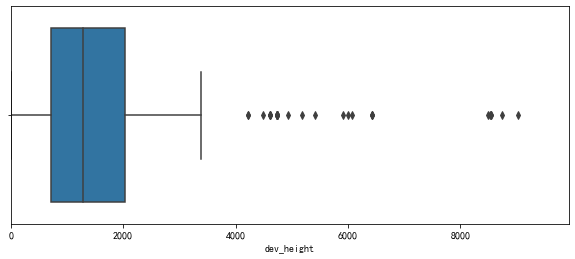

In [9]:
plt.figure(figsize=(10,4))
# x轴坐标范围
plt.xlim(df_train.dev_height.min(), df_train.dev_height.max()*1.1)
sns.boxplot(x=df_train.dev_height)
plt.show()

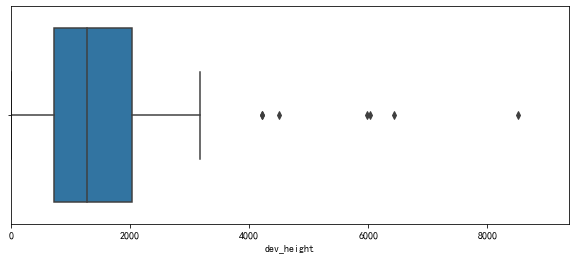

In [24]:
plt.figure(figsize=(10,4))
# x轴坐标范围
plt.xlim(df_test.dev_height.min(), df_test.dev_height.max()*1.1)
sns.boxplot(x=df_test.dev_height)
plt.show()

### 4.dev_ppi:屏幕分辨率
0还是多(4/5)

In [25]:
df_train.dev_ppi.value_counts()

0.0      383291
480.0     58775
3.0       23543
2.0       12891
320.0      8498
          ...  
369.0         1
384.0         1
192.0         1
333.0         1
60.0          1
Name: dev_ppi, Length: 92, dtype: int64

In [110]:
# df_test.dev_ppi.value_counts()

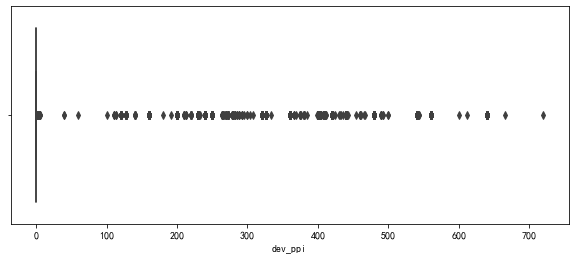

In [14]:
plt.figure(figsize=(10,4))
# x轴坐标范围
# plt.xlim(df_train.dev_ppi.min(), df_train.dev_ppi.max()*1.1)
sns.boxplot(x=df_train.dev_ppi)
plt.show()

### 5.dev_width	

In [26]:
df_train.dev_width.value_counts()

1080.0    209914
0.0       107011
360.0      76852
720.0      63317
393.0       6259
           ...  
1368.0         1
1361.0         1
1357.0         1
1354.0         1
686.0          1
Name: dev_width, Length: 346, dtype: int64

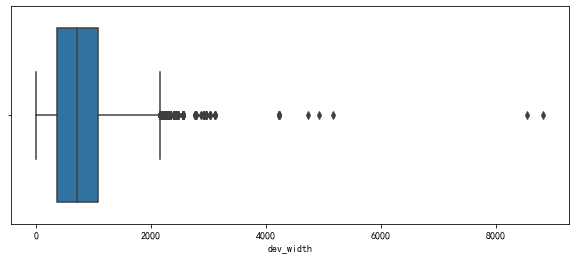

In [27]:
plt.figure(figsize=(10,4))
# x轴坐标范围
# plt.xlim(df_train.dev_ppi.min(), df_train.dev_ppi.max()*1.1)
sns.boxplot(x=df_train.dev_width)
plt.show()

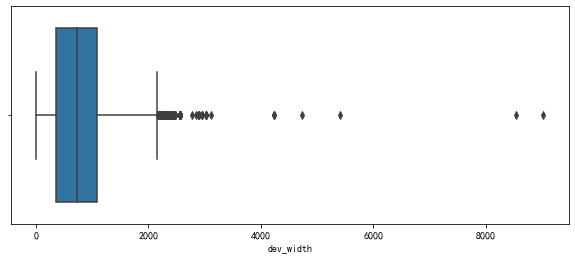

In [16]:
plt.figure(figsize=(10,4))
# x轴坐标范围
# plt.xlim(df_train.dev_ppi.min(), df_train.dev_ppi.max()*1.1)
sns.boxplot(x=df_test.dev_width)
plt.show()

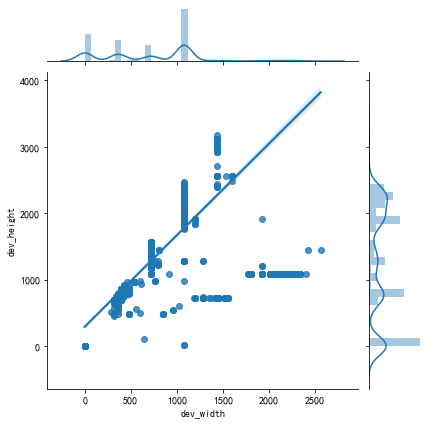

In [101]:
# sns.jointplot(x="dev_width",y="dev_height",data=df_train[:10000],kind="reg");

### 6.timestamp:时间戳,都是2019年6月的(2-9日)

In [10]:
df_train["Day"]=pd.to_datetime(df_train['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01')).dt.day
df_train["Hour"]=pd.to_datetime(df_train['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01')).dt.hour
df_train["minute"]=pd.to_datetime(df_train['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01')).dt.minute

In [11]:
df_test["Day"]=pd.to_datetime(df_test['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01')).dt.day
df_test["Hour"]=pd.to_datetime(df_test['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01')).dt.hour
df_test["minute"]=pd.to_datetime(df_test['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01')).dt.minute

### 7.location:地理位置

In [12]:
gc.collect()

2458

In [13]:
# for num in df_test["location"].unique():
#     if num not in df_train["location"].unique():
#         print(num)

In [14]:
from sklearn import preprocessing
le2 = preprocessing.LabelEncoder()

df_train.location=le2.fit_transform(df_train.location)
df_train["location"]=df_train["location"].astype("object")

df_test.location=le2.transform(df_test.location)
df_test["location"]=df_test["location"].astype("object")

### 8.version:在下版本，有何贵干
test 多一个“20”,将20归于最多的0类

In [15]:
for num in df_test["version"].unique():
    if num not in df_train["version"].unique():
        print(num)
print("------")
for num in df_train["version"].unique():
    if num not in df_test["version"].unique():
        print(num)

20
------


In [16]:
df_test.version=df_test.version.replace("20","0")

In [17]:

le3 = preprocessing.LabelEncoder()

df_train.version=le3.fit_transform(df_train.version)
df_train["version"]=df_train["version"].astype("object")

df_test.version=le3.transform(df_test.version)
df_test["version"]=df_test["version"].astype("object")

### 9.lan
train 和test 的标志不一致

只规划大于10个的标志，其余的规划为UNK(包括Nan)

In [18]:
def process_lan(x):
    set1=set(['zh-CN', 'zh', 'cn', 'zh_CN', 'Zh-CN', 'zh-cn', 'ZH', 'CN', 'tw', 'en','zh_CN_#Hans', 'ko'])
    if x in set1:
        return x
    else:
        return "unk"

In [19]:
df_train["lan"]=df_train["lan"].apply(process_lan)
df_test["lan"]=df_test["lan"].apply(process_lan)

In [20]:
from sklearn import preprocessing
le4 = preprocessing.LabelEncoder()

df_train.lan=le4.fit_transform(df_train.lan)
df_train["lan"]=df_train["lan"].astype("object")

df_test.lan=le4.transform(df_test.lan)
df_test["lan"]=df_test["lan"].astype("object")

### 10.media_id:媒体信息，对外媒体ID

test 与train 非对应

非对应的id最高出现不超过13次

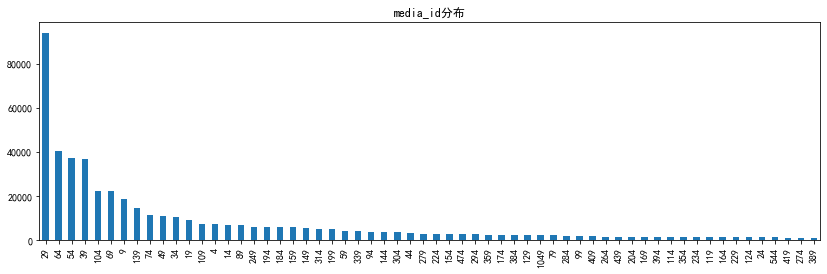

In [30]:
plt.figure(figsize=(14,4))
plt.title('media_id分布')
df_train["media_id"].value_counts().head(60).plot(kind="bar");

In [21]:
def cross_col(col):
    atrd=[]
    ated=[]
    for num in df_test[col].unique():
        if num not in df_train[col].unique():
            ated.append(num)
    for num in df_train[col].unique():
        if num not in df_test[col].unique():
            atrd.append(num)
    print("只存在test里:",ated)
    print("只存在train里:",atrd) 
cross_col("media_id")

只存在test里: [1124, 1504, 1474, 979, 1484, 1534, 1539, 1444]
只存在train里: [1044, 1284, 1404, 1184, 1349, 1289, 1314, 1329, 939, 784, 1129, 994, 1394, 1414, 1489, 1269, 1389, 1229, 1139, 1214, 1324, 1189, 1439, 1204, 1529, 1254, 1449, 969, 1099, 1319, 1429, 1434, 619, 1424, 1379, 984, 1104, 959, 1544, 989, 1499, 1199, 1239, 1219]


In [22]:
set2=set(df_train["media_id"].value_counts().head(60).index)
def process_media_id(x):
    if x in set2:
        return x
    else:
        return -1

In [23]:
df_train["media_id"]=df_train["media_id"].apply(process_media_id)
df_test["media_id"]=df_test["media_id"].apply(process_media_id)

In [24]:
from sklearn import preprocessing
le5 = preprocessing.LabelEncoder()

df_train.media_id=le5.fit_transform(df_train.media_id)
df_train["media_id"]=df_train["media_id"].astype("object")

df_test.media_id=le5.transform(df_test.media_id)
df_test["media_id"]=df_test["media_id"].astype("object")

In [25]:
cross_col("media_id")

只存在test里: []
只存在train里: []


### 11.ntt:网络类型 0-未知, 1-有线网, 2-WIFI, 3-蜂窝网络未知, 4-2G, 5-3G, 6–4G

In [26]:
cross_col("ntt")

只存在test里: []
只存在train里: [1.0]


In [27]:
df_train.ntt=df_train.ntt.replace(1.0,2.0)

In [28]:
from sklearn import preprocessing
le6 = preprocessing.LabelEncoder()

df_train.ntt=le6.fit_transform(df_train.ntt)
df_train["ntt"]=df_train["ntt"].astype("object")

df_test.ntt=le6.transform(df_test.ntt)
df_test["ntt"]=df_test["ntt"].astype("object")

### 12.os

In [29]:
cross_col("os")

只存在test里: []
只存在train里: []


In [30]:
df_train.os.value_counts()

android    303175
Android    196825
Name: os, dtype: int64

In [31]:
from sklearn import preprocessing
le7 = preprocessing.LabelEncoder()

df_train.os=le7.fit_transform(df_train.os)
df_train["os"]=df_train["os"].astype("object")

df_test.os=le7.transform(df_test.os)
df_test["os"]=df_test["os"].astype("object")

### 13.osv:
这版本也太多了把，用正则表达式也匹配不了把,还有nan的字符串

这里用粗略匹配，用第一个数字表示版本，转换成为int64

In [33]:
gc.collect()

1606

In [32]:
cross_col("osv")

只存在test里: [nan, 'Android_4.1.1', '6.0.1_22', '4.4.6', 'Android_3.2.0-FL2-20180726.9015', '71300', 'Android 4.0.3', 'Android_7.0.0', '12.0', 'Android_4.0.4', 'GIONEE_YNGA']
只存在train里: [nan, '9.1', '7910', '10.3.3', '2.3.6', '4.4.2_19', '2.3.5', '6.0 十核2.0G_HD', '5.1_22', 'Android 5.12', '6.0.2', '4.3.1', '2.3.7', 'Android_4.1.2', '6.1.0-RS-20190305.1125', '71200', '5.1.1_22', '4', '5.3.0', '5.1.1-F-20180719.9007', 'Android_5.0.1', '8.0.2', '9.1.0', '3.2.0-FL2-20180726.9015', '5.3', 'f073b_changxiang_v01_b1b8_20180915', 'Android_4.4.3', 'Android 7.1', '%E6%B1%9F%E7%81%B5OS+5.0', 'Android 4.2.9', '7920', '5.0.3', '2.9.2', 'Android 4.3.1', '2.2.2']


In [34]:
def process_osv(x): 
    try:
        x=int(re.findall("\d{1}",x)[0])
        return x
    except:
        return 0

In [38]:
df_train.osv=df_train.osv.apply(process_osv)
df_test.osv=df_test.osv.apply(process_osv)

In [39]:
cross_col("osv")

只存在test里: []
只存在train里: []


### 14.package:媒体信息，包名（已加密）

In [41]:
# cross_col("package")

只存在test里: [2201, 2025, 1249, 1804, 1811, 1857, 787, 1186, 743, 1891, 1943, 1934, 1555, 2240, 1799, 2306, 1739, 995, 577, 1486, 1892, 1303, 484, 1580, 917, 1828, 2095, 2091, 2229, 1488, 674, 1839, 685, 1788, 1758, 1607, 1156, 701, 1609, 1815, 1992, 810, 1021, 2259, 2056, 1507, 2070, 1493, 1252, 1321, 723, 2106, 898, 790, 1447, 1432, 1258, 548, 1232, 1553, 2233, 1756, 1440, 1889, 2043, 2158, 2002, 2141, 1700, 1715, 2288, 1357, 2260, 1361, 2287, 1803, 2113, 2189, 2144, 1671, 2311, 1596, 1658, 724, 687, 1257, 1814, 714, 1641, 1435, 2018, 2182, 1897, 1916, 2072, 1326, 1724, 2112, 1662, 1518, 1172, 1876, 933, 1737, 1608, 2187, 1860, 1490, 872, 2012, 1945, 719, 2110, 2037, 2231, 2151, 2326, 2227, 1984, 1884, 289, 2268, 2028, 881, 2150, 608, 1656, 2183, 1316, 1260, 1649, 1539, 2293, 2078, 2094, 1214, 759, 1457, 1801, 2020, 2300, 530, 2169, 1593, 2064, 2184, 1923, 2246, 2265, 1009, 1986, 1929]
只存在train里: [397, 443, 1716, 691, 950, 1023, 1625, 1276, 842, 1317, 885, 1383, 1640, 1618, 2039, 1079, 

In [50]:
set3=set(df_train.package.value_counts().head(200).index)
def process_package(x):
    if x in set3:
        return x
    else:
        return -1

In [52]:
df_train.package=df_train.package.apply(process_package)
df_test.package=df_test.package.apply(process_package)

In [53]:
cross_col("package")
gc.collect()

只存在test里: []
只存在train里: []


14487

In [54]:
from sklearn import preprocessing
le8 = preprocessing.LabelEncoder()

df_train.package=le8.fit_transform(df_train.package)
df_train["package"]=df_train["package"].astype("object")

df_test.package=le8.transform(df_test.package)
df_test["package"]=df_test["package"].astype("object")

### 15.fea_hash:int64

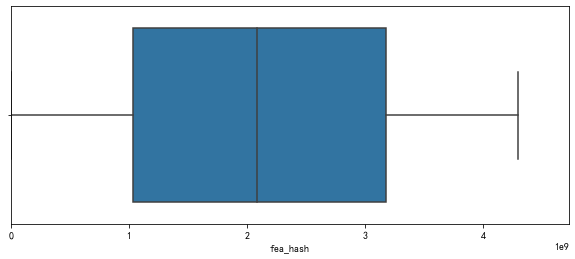

In [56]:
plt.figure(figsize=(10,4))
# x轴坐标范围
plt.xlim(df_train.fea_hash.min(), df_train.fea_hash.max()*1.1)
sns.boxplot(x=df_train.fea_hash)
plt.show()

### 16.fea1_hash

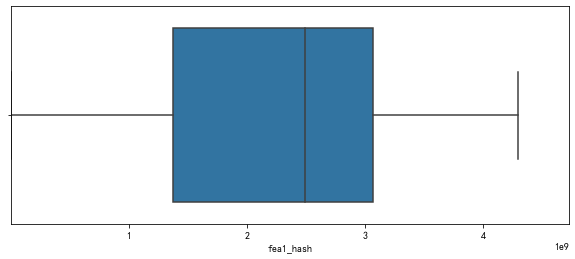

In [60]:
plt.figure(figsize=(10,4))
# x轴坐标范围
plt.xlim(df_train.fea1_hash.min(), df_train.fea1_hash.max()*1.1)
sns.boxplot(x=df_train.fea1_hash)
plt.show()

In [72]:
set4=set(df_train.fea1_hash.value_counts().head(500).index)
def process_fea1_hash(x):
    if x in set4:
        return x
    else:
        return -1

In [73]:
df_train.fea1_hash=df_train.fea1_hash.apply(process_fea1_hash)
df_test.fea1_hash=df_test.fea1_hash.apply(process_fea1_hash)

In [74]:
# cross_col("fea1_hash")

只存在test里: []
只存在train里: []


In [75]:
from sklearn import preprocessing
le9 = preprocessing.LabelEncoder()

df_train.fea1_hash=le9.fit_transform(df_train.fea1_hash)
df_train["fea1_hash"]=df_train["fea1_hash"].astype("object")

df_test.fea1_hash=le9.transform(df_test.fea1_hash)
df_test["fea1_hash"]=df_test["fea1_hash"].astype("object")

### 17.cus_type

In [76]:
cross_col("cus_type")

只存在test里: []
只存在train里: []


In [79]:
from sklearn import preprocessing
le10 = preprocessing.LabelEncoder()

df_train.cus_type=le10.fit_transform(df_train.cus_type)
df_train["cus_type"]=df_train["cus_type"].astype("object")

df_test.cus_type=le10.transform(df_test.cus_type)
df_test["cus_type"]=df_test["cus_type"].astype("object")

In [80]:
summary_stats_table(df_train)

,dtype,count,count_null,unique,min,max,25%,50%,75%,top,freq
label,int64,500000.0,0,,0,1,0,0,1,,
osv,int64,500000.0,0,,0,9,6,8,8,,
fea_hash,int64,500000.0,0,,0,4.29494e+09,1.03451e+09,2.08719e+09,3.17491e+09,,
Day,int64,500000.0,0,,2,9,4,6,8,,
Hour,int64,500000.0,0,,0,23,5,10,14,,
minute,int64,500000.0,0,,0,59,14,29,44,,
dev_height,float64,500000.0,0,,0,9024,720,1280,2040,,
dev_ppi,float64,500000.0,0,,0,720,0,0,0,,
dev_width,float64,500000.0,0,,0,8832,360,720,1080,,
timestamp,float64,500000.0,0,,1.55949e+12,1.5601e+12,1.55966e+12,1.55982e+12,1.55996e+12,,


In [81]:
summary_stats_table(df_test)

,dtype,count,count_null,unique,min,max,25%,50%,75%,top,freq
osv,int64,150000.0,0,,0,9,6,8,8,,
fea_hash,int64,150000.0,0,,0,4.29492e+09,1.02766e+09,2.08538e+09,3.18382e+09,,
Day,int64,150000.0,0,,2,9,4,6,8,,
Hour,int64,150000.0,0,,0,23,5,10,14,,
minute,int64,150000.0,0,,0,59,14,29,44,,
dev_height,float64,150000.0,0,,0,8512,720,1280,2038,,
dev_ppi,float64,150000.0,0,,0,640,0,0,0,,
dev_width,float64,150000.0,0,,0,9024,360,720,1080,,
timestamp,float64,150000.0,0,,1.55949e+12,1.5601e+12,1.55966e+12,1.55982e+12,1.55996e+12,,
location,object,150000.0,0,332,,,,,,49,4496


In [83]:
# df_train.to_pickle("./processed_data/df_train.pkl")
# df_test.to_pickle("./processed_data/df_test.pkl")

## 二、构造用户特征

In [4]:
import lightgbm as lgb
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msno
import datetime
import seaborn as sns
plt.rcParams['font.sans-serif']=['SimHei']
plt.rcParams['axes.unicode_minus'] = False
import gc
from collections import Counter
import re
from sklearn import preprocessing

In [5]:
df_train=pd.read_pickle("./processed_data/df_train.pkl")
df_test=pd.read_pickle("./processed_data/df_test.pkl")

In [18]:
def summary_stats_table(data):
    '''
    祖传代码：分类型按列的数据分布与异常值统计
    '''
    # 空值数量
    missing_counts = pd.DataFrame(data.isnull().sum())
    missing_counts.columns = ['count_null']

    # 数值列数据分布统计
    num_stats = data.select_dtypes(include=['int64','float64','int32']).describe().loc[['count','min','max','25%','50%','75%']].transpose()
    num_stats['dtype'] = data.select_dtypes(include=['int64','float64','int32']).dtypes.tolist()

    # 非数值列数据分布统计
    non_num_stats = data.select_dtypes(exclude=['int64','float64','int32']).describe().transpose()
    non_num_stats['dtype'] = data.select_dtypes(exclude=['int64','float64','int32']).dtypes.tolist()
    non_num_stats = non_num_stats.rename(columns={"first": "min", "last": "max"})

    # 聚合结果
    stats_merge = pd.concat([num_stats, non_num_stats], axis=0, join='outer', ignore_index=False, keys=None,
              levels=None, names=None, verify_integrity=False, copy=True, sort=False).fillna("").sort_values('dtype')

    column_order = ['dtype', 'count', 'count_null','unique','min','max','25%','50%','75%','top','freq']
    summary_stats = pd.merge(stats_merge, missing_counts, left_index=True, right_index=True, sort=False)[column_order]
    return(summary_stats)

In [19]:
summary_stats_table(df_train)

,dtype,count,count_null,unique,min,max,25%,50%,75%,top,freq
label,int64,500000.0,0,,0,1,0,0,1,,
osv,int64,500000.0,0,,0,9,6,8,8,,
fea_hash,int64,500000.0,0,,0,4.29494e+09,1.03451e+09,2.08719e+09,3.17491e+09,,
Day,int64,500000.0,0,,2,9,4,6,8,,
Hour,int64,500000.0,0,,0,23,5,10,14,,
minute,int64,500000.0,0,,0,59,14,29,44,,
dev_height,float64,500000.0,0,,0,9024,720,1280,2040,,
dev_ppi,float64,500000.0,0,,0,720,0,0,0,,
dev_width,float64,500000.0,0,,0,8832,360,720,1080,,
timestamp,float64,500000.0,0,,1.55949e+12,1.5601e+12,1.55966e+12,1.55982e+12,1.55996e+12,,


In [20]:
summary_stats_table(df_test)

,dtype,count,count_null,unique,min,max,25%,50%,75%,top,freq
osv,int64,150000.0,0,,0,9,6,8,8,,
fea_hash,int64,150000.0,0,,0,4.29492e+09,1.02766e+09,2.08538e+09,3.18382e+09,,
Day,int64,150000.0,0,,2,9,4,6,8,,
Hour,int64,150000.0,0,,0,23,5,10,14,,
minute,int64,150000.0,0,,0,59,14,29,44,,
dev_height,float64,150000.0,0,,0,8512,720,1280,2038,,
dev_ppi,float64,150000.0,0,,0,640,0,0,0,,
dev_width,float64,150000.0,0,,0,9024,360,720,1080,,
timestamp,float64,150000.0,0,,1.55949e+12,1.5601e+12,1.55966e+12,1.55982e+12,1.55996e+12,,
location,object,150000.0,0,332,,,,,,49,4496


In [113]:
user=pd.DataFrame()
user["uid"]=df_train.groupby("android_id").count().index
user=user.set_index("uid")

In [114]:
user.head()

""
uid
0
4
7
12
13


### 用户 most ,freq特征

In [104]:
def most1(x):
    ind,freq=Counter(x).most_common(1)[0]
    return ind
def most2(x):
    ind,freq=Counter(x).most_common(1)[0]
    return freq

In [105]:
def uid_most_freq(df,col):
    print("start: {}_most_index".format(col) ) #30s
    name="{}_most_index".format(col)
    df[name]=df_train.groupby("android_id")[col].apply(most1)
    print("start: {}_most_freq".format(col) ) #30s
    name="{}_most_freq".format(col)
    df[name]=df_train.groupby("android_id")[col].apply(most2)
    return df

In [107]:
user=uid_most_freq(user,"package")

start: package_most_index
start: package_most_freq


In [110]:
df_train.columns

Index(['android_id', 'apptype', 'carrier', 'dev_height', 'dev_ppi',
       'dev_width', 'label', 'lan', 'media_id', 'ntt', 'os', 'osv', 'package',
       'timestamp', 'version', 'fea_hash', 'location', 'fea1_hash', 'cus_type',
       'Day', 'Hour', 'minute'],
      dtype='object')

### 提取需要most和freq的列

In [115]:
freq_columns=['apptype','carrier','lan','media_id', 'ntt', 'os', 'osv', 'package','version', 'location', 'fea1_hash', 'cus_type','Day', 'Hour']
for col in freq_columns:
    user=uid_most_freq(user,col)

start: apptype_most_index
start: apptype_most_freq
start: carrier_most_index
start: carrier_most_freq
start: lan_most_index
start: lan_most_freq
start: media_id_most_index
start: media_id_most_freq
start: ntt_most_index
start: ntt_most_freq
start: os_most_index
start: os_most_freq
start: osv_most_index
start: osv_most_freq
start: package_most_index
start: package_most_freq
start: version_most_index
start: version_most_freq
start: location_most_index
start: location_most_freq
start: fea1_hash_most_index
start: fea1_hash_most_freq
start: cus_type_most_index
start: cus_type_most_freq
start: Day_most_index
start: Day_most_freq
start: Hour_most_index
start: Hour_most_freq


In [116]:
user

,apptype_most_index,apptype_most_freq,carrier_most_index,carrier_most_freq,lan_most_index,lan_most_freq,media_id_most_index,media_id_most_freq,ntt_most_index,ntt_most_freq,...,location_most_index,location_most_freq,fea1_hash_most_index,fea1_hash_most_freq,cus_type_most_index,cus_type_most_freq,Day_most_index,Day_most_freq,Hour_most_index,Hour_most_freq
uid,,,,,,,,,,,,,,,,,,,,,
0,48,87740,1,125850,9,86989,6,87244,1,79745,...,22,3311,480,28393,6,126686,4,19570,13,7860
4,68,1,1,1,2,1,5,1,1,1,...,14,1,113,1,11,1,3,1,13,1
7,4,1,1,1,9,1,9,1,2,1,...,187,1,339,1,44,1,9,1,5,1
12,38,1,1,1,9,1,12,1,5,1,...,17,1,234,1,22,1,9,1,6,1
13,62,1,2,1,9,1,13,1,1,1,...,11,1,447,1,52,1,8,1,23,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
709888,81,1,1,1,3,1,20,1,5,1,...,159,1,301,1,21,1,3,1,15,1
709891,83,1,2,1,7,1,7,1,1,1,...,234,1,238,1,54,1,2,1,21,1
709892,7,1,1,1,9,1,0,1,1,1,...,100,1,375,1,27,1,2,1,17,1


In [93]:
df_train[df_train.android_id==0]["package"]

sid
1387136     99
1597216      5
1785622      5
1935139      5
1904621    162
          ... 
1832931     36
1483392      5
1140948      5
1287594      5
1755698      5
Name: package, Length: 126686, dtype: object

## classfication

In [18]:
import lightgbm as lgb
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msno
import datetime
import seaborn as sns
plt.rcParams['font.sans-serif']=['SimHei']
plt.rcParams['axes.unicode_minus'] = False
import gc
from collections import Counter
from sklearn.model_selection import GroupKFold, KFold, StratifiedKFold
from sklearn.model_selection import GridSearchCV
import re
from sklearn import preprocessing

In [28]:
feature_train=pd.read_pickle("./processed_data/df_train.pkl")
feature_test=pd.read_pickle("./processed_data/df_test.pkl")
feature_test["label"]=0

In [29]:
feature_train.columns

Index(['android_id', 'apptype', 'carrier', 'dev_height', 'dev_ppi',
       'dev_width', 'label', 'lan', 'media_id', 'ntt', 'os', 'osv', 'package',
       'timestamp', 'version', 'fea_hash', 'location', 'fea1_hash', 'cus_type',
       'Day', 'Hour', 'minute'],
      dtype='object')

In [30]:
feature_train.index

Int64Index([1438873, 1185582, 1555716, 1093419, 1400089, 1253737, 1387136,
            1597216, 1910989, 1785622,
            ...
            1381992, 1402958, 1472150, 1421676, 1555117, 1546078, 1480612,
            1698442, 1331155, 1373973],
           dtype='int64', name='sid', length=500000)

In [31]:
feature_train

,android_id,apptype,carrier,dev_height,dev_ppi,dev_width,label,lan,media_id,ntt,...,package,timestamp,version,fea_hash,location,fea1_hash,cus_type,Day,Hour,minute
sid,,,,,,,,,,,,,,,,,,,,,
1438873,316361,81,1,0.0,0.0,0.0,1,7,20,5,...,18,1.559893e+12,13,2135019403,1,301,16,7,7,32
1185582,135939,31,0,0.0,0.0,0.0,1,7,4,5,...,1,1.559994e+12,8,2782306428,2,353,37,8,11,40
1555716,399254,22,0,760.0,0.0,360.0,1,7,0,0,...,1,1.559837e+12,1,1392806005,3,73,21,6,15,58
1093419,68983,49,1,2214.0,0.0,1080.0,0,7,25,1,...,1,1.560042e+12,1,3562553457,4,152,24,9,0,59
1400089,288999,62,1,2280.0,0.0,1080.0,1,9,13,1,...,1,1.559867e+12,9,2364522023,5,189,15,7,0,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1546078,392477,53,1,1920.0,3.0,1080.0,1,9,27,5,...,25,1.559834e+12,12,861755946,80,18,4,6,15,14
1480612,346134,48,0,1424.0,0.0,720.0,0,7,6,1,...,1,1.559814e+12,7,1714444511,24,345,12,6,9,40
1698442,499635,12,1,1280.0,0.0,720.0,0,7,11,5,...,10,1.559676e+12,1,3843262581,26,159,27,4,19,14


### define

In [35]:
cate_feature = ["apptype", "carrier", "lan","media_id","ntt", "os", "package", "version", "location", "fea1_hash", "cus_type"]
for item in cate_feature:
    le=preprocessing.LabelEncoder()
    feature_train[item] = le.fit_transform(feature_train[item])
    feature_test[item] = le.transform(feature_test[item])

prediction = feature_test[['apptype', 'carrier', 'dev_height', 'dev_ppi',
       'dev_width', 'lan', 'media_id', 'ntt', 'os', 'osv', 'package',
       'timestamp', 'version', 'fea_hash', 'location', 'fea1_hash', 'cus_type',
       'Day', 'Hour', 'minute']]
prediction['label'] = 0


y_col = 'label'
x_col = ['apptype', 'carrier', 'dev_height', 'dev_ppi',
       'dev_width', 'lan', 'media_id', 'ntt', 'os', 'osv', 'package',
       'timestamp', 'version', 'fea_hash', 'location', 'fea1_hash', 'cus_type',
       'Day', 'Hour', 'minute']

model = lgb.LGBMClassifier(
    boosting_type='gbdt',
    # class_weight="is_unbalance",
                           num_leaves=50,
                           max_depth=7,
                           learning_rate=0.03,
                           n_estimators=10000,
                           subsample=0.8,
                           feature_fraction=0.8,
                           reg_alpha=0.8,
                           reg_lambda=0.8,
                           random_state=220,
                           metric=None,
                           n_jobs=-1
                           )

In [43]:
oof = []
df_importance_list = []
n=5
kfold = KFold(n_splits=n)
for fold_id, (trn_idx, val_idx) in enumerate(kfold.split(feature_train[x_col], feature_train[y_col])):
    X_train = feature_train.iloc[trn_idx][x_col]
    Y_train = feature_train.iloc[trn_idx][y_col]

    X_val = feature_train.iloc[val_idx][x_col]
    Y_val = feature_train.iloc[val_idx][y_col]

    print('\nFold_{} Training ================================\n'.format(fold_id+1))

    lgb_model = model.fit(
        X_train,
        Y_train,
        eval_names=['train', 'valid'],
        eval_set=[(X_train, Y_train), (X_val, Y_val)],
        verbose=200,
        eval_metric='auc',
        early_stopping_rounds=200
    )

    pred_val = lgb_model.predict_proba(X_val, num_iteration=lgb_model.best_iteration_)[:, 1]
    df_oof = feature_train.iloc[val_idx].copy()
    df_oof['pred'] = pred_val
    oof.append(df_oof)

    pred_test = lgb_model.predict_proba(feature_test[x_col], num_iteration=lgb_model.best_iteration_)[:, 1]
    prediction['label'] += pred_test / n

    df_importance = pd.DataFrame({
        'column': x_col,
        'importance': lgb_model.feature_importances_,
    })
    df_importance_list.append(df_importance)


Fold_1 Training ================================

Training until validation scores don't improve for 200 rounds
[200]	train's auc: 0.936411	valid's auc: 0.936788
[400]	train's auc: 0.940397	valid's auc: 0.93982
[600]	train's auc: 0.942818	valid's auc: 0.941065
[800]	train's auc: 0.944739	valid's auc: 0.941794
[1000]	train's auc: 0.9464	valid's auc: 0.942233
[1200]	train's auc: 0.947926	valid's auc: 0.94253
[1400]	train's auc: 0.949183	valid's auc: 0.942749
[1600]	train's auc: 0.950428	valid's auc: 0.942823
[1800]	train's auc: 0.951704	valid's auc: 0.943006
[2000]	train's auc: 0.952862	valid's auc: 0.943064
[2200]	train's auc: 0.953901	valid's auc: 0.943064
Early stopping, best iteration is:
[2014]	train's auc: 0.95294	valid's auc: 0.943075

Fold_2 Training ================================

Training until validation scores don't improve for 200 rounds
[200]	train's auc: 0.936813	valid's auc: 0.933626
[400]	train's auc: 0.941142	valid's auc: 0.937117
[600]	train's auc: 0.94347	valid's a

In [44]:
df_importance = pd.concat(df_importance_list)
df_importance = df_importance.groupby(['column'])['importance'].agg('mean').sort_values(ascending=False).reset_index()
df_importance

,column,importance
0,dev_height,12094.8
1,fea_hash,11563.2
2,location,11494.6
3,timestamp,10960.8
4,fea1_hash,8733.6
5,minute,8640.0
6,cus_type,8102.8
7,apptype,6744.4
8,Hour,6121.8
9,package,5907.6


In [40]:
prediction

,apptype,carrier,dev_height,dev_ppi,dev_width,lan,media_id,ntt,os,osv,...,timestamp,version,fea_hash,location,fea1_hash,cus_type,Day,Hour,minute,label
sid,,,,,,,,,,,,,,,,,,,,,
1440682,78,2,2196.0,2.0,1080.0,0,0,1,0,8,...,1.559872e+12,12,1672223856,58,448,19,7,1,43,0.012910
1606824,41,4,2280.0,3.0,1080.0,9,0,5,0,8,...,1.559739e+12,7,3767901757,24,14,34,5,12,53,0.147388
1774642,68,2,0.0,0.0,0.0,7,8,1,1,5,...,1.559614e+12,1,454638703,31,483,6,4,2,8,0.004041
1742535,12,2,1344.0,0.0,720.0,7,11,1,1,7,...,1.559668e+12,1,1507622951,66,403,29,4,17,3,0.013574
1689686,48,2,665.0,0.0,320.0,9,6,4,0,8,...,1.559694e+12,1,4116351093,149,328,6,5,0,16,0.191902
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1165373,48,2,760.0,0.0,360.0,9,6,1,0,8,...,1.559957e+12,1,3162887451,127,341,6,8,1,21,0.188202
1444115,48,2,780.0,0.0,360.0,9,6,1,0,9,...,1.559863e+12,1,97238959,323,336,6,6,23,15,0.191899
1134378,48,2,780.0,0.0,360.0,9,6,4,0,8,...,1.560041e+12,1,1320118495,47,323,6,9,0,48,0.185864


In [41]:
a = pd.DataFrame(prediction.index)

In [49]:
x_col = ['apptype', 'carrier', 'dev_height', 'dev_ppi',
       'dev_width', 'lan', 'media_id', 'ntt', 'os', 'osv', 'package',
       'timestamp', 'version', 'fea_hash', 'location', 'fea1_hash', 'cus_type',
       'Day', 'Hour', 'minute']
a['label'] = lgb_model.predict(prediction[x_col])

In [51]:
a.to_csv('submission.csv', index=False)